## Data Set Information:

Extraction was done by Barry Becker from the 1994 Census database.

Prediction task is to determine whether a person makes over 50K a year. 

## Attribute Information:



Listing of attributes:

>50K, <=50K.

**age:** continuous.   
**workclass:** Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.   
**fnlwgt:** continuous.   
**education:** Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.  
**education-num:** continuous.   
**marital-status:** Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.  
**occupation:** Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.   
**relationship:** Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.  
**race:** White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.  
**sex:** Female, Male.  
**capital-gain:** continuous.  
**capital-loss:** continuous.  
**hours-per-week:** continuous.  
**native-country:** United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

In [305]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# import StandardScaler to perform scaling
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing 

import warnings
warnings.filterwarnings('ignore')

In [370]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import confusion_matrix, classification_report 
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
import pydotplus
from IPython.display import Image 
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier

In [306]:
from IPython.display import Markdown, display

def printmd(string):
    display(Markdown(string))

In [307]:
df = pd.read_csv("adult.csv")

In [308]:
df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'educational-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')

In [310]:
df = df.replace('?', np.NaN)
df = df.dropna(axis = 0)
df = df.reset_index(drop=True)
df

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45217,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
45218,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
45219,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
45220,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [315]:
df['income'].value_counts()

<=50K    34014
>50K     11208
Name: income, dtype: int64

In [316]:
df['income'] = (df['income']==("<=50K")).astype(int)

df['income']

0        1
1        1
2        0
3        0
4        1
        ..
45217    1
45218    0
45219    1
45220    1
45221    0
Name: income, Length: 45222, dtype: int64

In [318]:
printmd('## 1. Data')
df.head()

## 1. Data

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,1
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,1
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,0
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,0
4,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,1


In [319]:
printmd('### Shape of the data')
df.shape

### Shape of the data

(45222, 15)

In [320]:
printmd('## 1.1. Columns and their types')
df.info()

printmd('#### *We can interpret that there are 15 columns in the Adult Income Dataset*')

## 1.1. Columns and their types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45222 entries, 0 to 45221
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              45222 non-null  int64 
 1   workclass        45222 non-null  object
 2   fnlwgt           45222 non-null  int64 
 3   education        45222 non-null  object
 4   educational-num  45222 non-null  int64 
 5   marital-status   45222 non-null  object
 6   occupation       45222 non-null  object
 7   relationship     45222 non-null  object
 8   race             45222 non-null  object
 9   gender           45222 non-null  object
 10  capital-gain     45222 non-null  int64 
 11  capital-loss     45222 non-null  int64 
 12  hours-per-week   45222 non-null  int64 
 13  native-country   45222 non-null  object
 14  income           45222 non-null  int64 
dtypes: int64(7), object(8)
memory usage: 5.2+ MB


#### *We can interpret that there are 15 columns in the Adult Income Dataset*

In [321]:
printmd('## 1.2. Summary Statistics')
df.describe()

## 1.2. Summary Statistics

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week,income
count,45222.000000,4.522200e+04,45222.000000,45222.000000,45222.000000,45222.000000,45222.000000
mean,38.547941,1.897347e+05,10.118460,1101.430344,88.595418,40.938017,0.752156
std,13.217870,1.056392e+05,2.552881,7506.430084,404.956092,12.007508,0.431766
min,17.000000,1.349200e+04,1.000000,0.000000,0.000000,1.000000,0.000000
25%,28.000000,1.173882e+05,9.000000,0.000000,0.000000,40.000000,1.000000
50%,37.000000,1.783160e+05,10.000000,0.000000,0.000000,40.000000,1.000000
75%,47.000000,2.379260e+05,13.000000,0.000000,0.000000,45.000000,1.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000,1.000000


In [322]:
printmd('## 1.3. Check for Missing Values')
df.isnull().sum()

## 1.3. Check for Missing Values

age                0
workclass          0
fnlwgt             0
education          0
educational-num    0
marital-status     0
occupation         0
relationship       0
race               0
gender             0
capital-gain       0
capital-loss       0
hours-per-week     0
native-country     0
income             0
dtype: int64

#### Treating Missing Values

In [323]:
printmd('## 1.4. Missing values')
for i,j in zip(df.columns,(df.values.astype(str) == '?').sum(axis = 0)):
    if j > 0:
        printmd(str(i) + ': ' + str(j) + ' records')

## 1.4. Missing values

In [325]:
df['workclass'].value_counts(dropna = False).to_frame()

,workclass
Private,33307
Self-emp-not-inc,3796
Local-gov,3100
State-gov,1946
Self-emp-inc,1646
Federal-gov,1406
Without-pay,21


In [326]:
df['occupation'].value_counts(dropna = False).to_frame()

,occupation
Craft-repair,6020
Prof-specialty,6008
Exec-managerial,5984
Adm-clerical,5540
Sales,5408
Other-service,4808
Machine-op-inspct,2970
Transport-moving,2316
Handlers-cleaners,2046
Farming-fishing,1480


In [327]:
df['native-country'].value_counts(dropna = False).to_frame()

,native-country
United-States,41292
Mexico,903
Philippines,283
Germany,193
Puerto-Rico,175
Canada,163
El-Salvador,147
India,147
Cuba,133
England,119


Fixing the common Nan Values

In [328]:
attrib, counts = np.unique(df['workclass'], return_counts = True)
most_freq_attrib = attrib[np.argmax(counts, axis = 0)]
df['workclass'][df['workclass'] == '?'] = most_freq_attrib 

attrib, counts = np.unique(df['occupation'], return_counts = True)
most_freq_attrib = attrib[np.argmax(counts, axis = 0)]
df['occupation'][df['occupation'] == '?'] = most_freq_attrib 

attrib, counts = np.unique(df['native-country'], return_counts = True)
most_freq_attrib = attrib[np.argmax(counts, axis = 0)]
df['native-country'][df['native-country'] == '?'] = most_freq_attrib 

In [329]:
df.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,1
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,1
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,0
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,0
4,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,1


## Quantitative and Quantitative Analysis

### Is there any effect of a persons age on the working hours

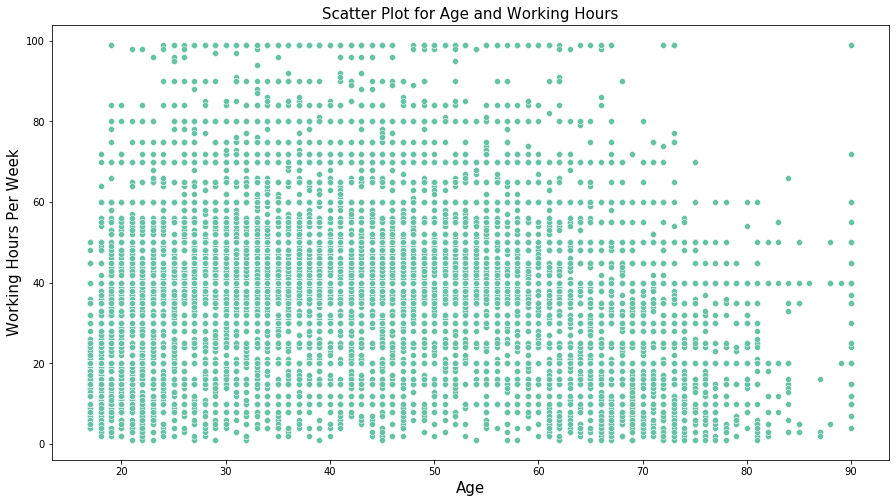

In [115]:
printmd('### Is there any effect of a persons age on the working hours')
# set the figure size
plt.figure(figsize = (15,8))

# plot a scatter plot to check the relationship
sns.scatterplot(x = df['age'], y = df['hours-per-week'], data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Scatter Plot for Age and Working Hours', fontsize = 15)
plt.xlabel('Age', fontsize = 15)
plt.ylabel('Working Hours Per Week', fontsize = 15)

# display the plot
plt.show()

The scatter plot shows no specific relationship between the age of a person and the number of working hours. There is an extreme observation of age nearly 90 years corresponding to 100 working hours.

### Analyze the trend of the capital gain amount for different educational qualifications

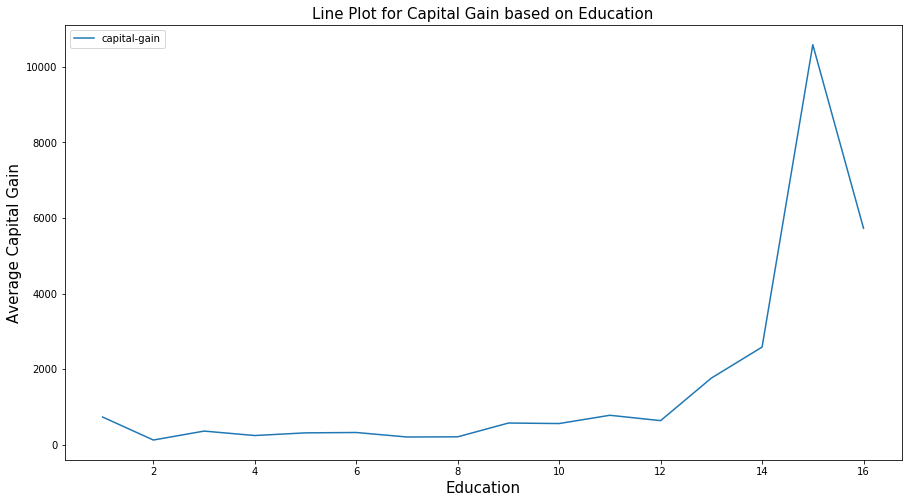

In [18]:
printmd('### Analyze the trend of the capital gain amount for different educational qualifications')
# compute average of 'capital.gain' for unique educational number using groupby()
df[['capital-gain', 'educational-num']].groupby('educational-num').mean().plot(figsize = (15,8))

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Line Plot for Capital Gain based on Education', fontsize = 15)
plt.xlabel('Education', fontsize = 15)
plt.ylabel('Average Capital Gain', fontsize = 15)

# display the plot
plt.show()

The above line plot shows how education affects the capital gain. The highest average gain amount is for individuals with education number 15.

###  Check the effect of working hours of individuals on capital gain 

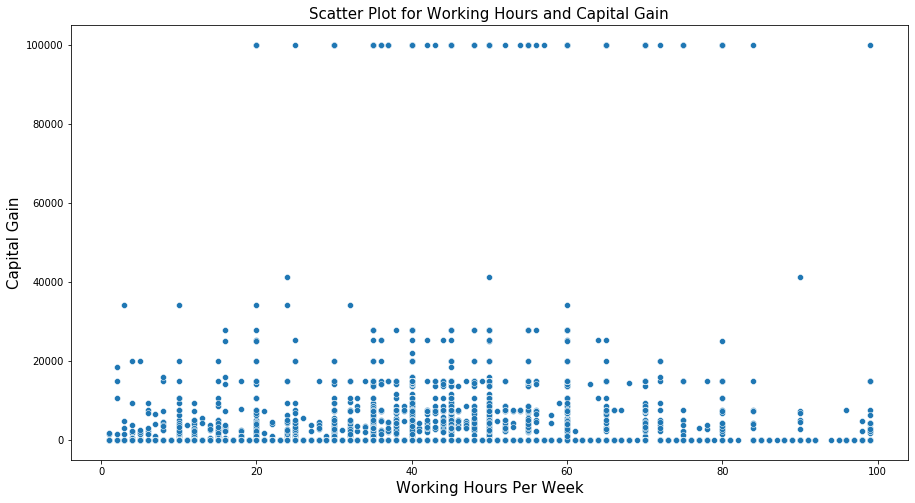

In [19]:
printmd('###  Check the effect of working hours of individuals on capital gain ')
plt.figure(figsize = (15,8))

# plot a scatter plot to check the relationship
sns.scatterplot(x = df['hours-per-week'], y =df['capital-gain'])

# add plot and axes labels
# set font size using 'fontsize'
plt.title('Scatter Plot for Working Hours and Capital Gain', fontsize = 15)
plt.xlabel('Working Hours Per Week', fontsize = 15)
plt.ylabel('Capital Gain', fontsize = 15)

# display the plot
plt.show()

The scatter plot shows the presence of extreme points for the capital gain of 100000.

### Find the trend in the average working hours corresponding to the age of an individual

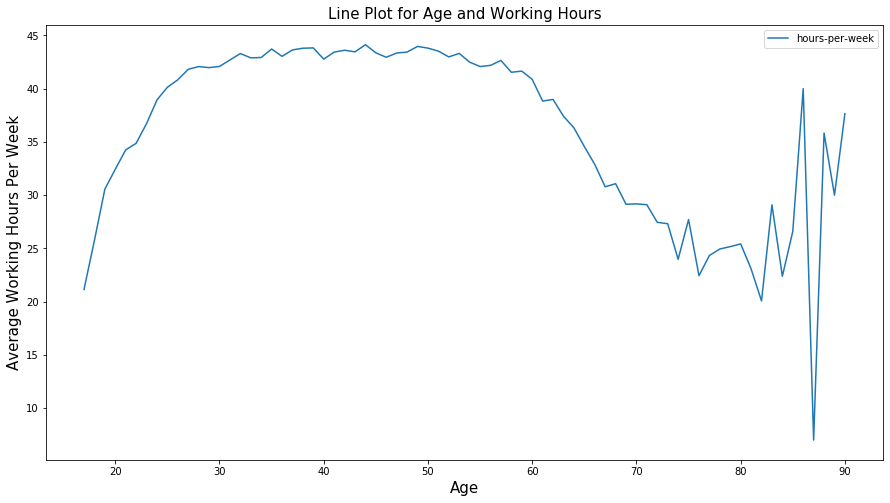

In [20]:
printmd('### Find the trend in the average working hours corresponding to the age of an individual')
df[['age', 'hours-per-week']].groupby('age').mean().plot(figsize = (15,8))

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Line Plot for Age and Working Hours', fontsize = 15)
plt.xlabel('Age', fontsize = 15)
plt.ylabel('Average Working Hours Per Week', fontsize = 15)

# display the plot
plt.show()

The line plot shows that the average working hours are increasing with age. After 60 years of age, the working hours are decreasing. It also shows that some older individuals with age between 80 to 90 years are working for more than 30 hours.

### Check the distribution of the average capital loss corresponding to the age

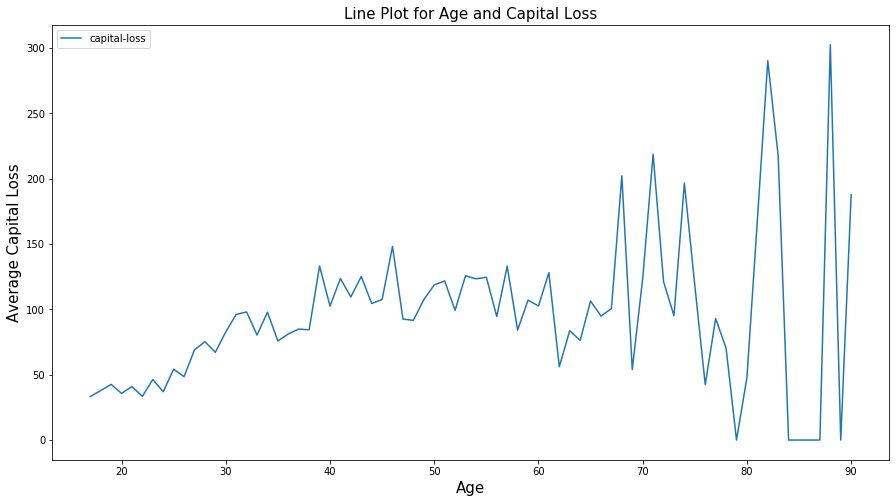

In [21]:
printmd('### Check the distribution of the average capital loss corresponding to the age')
df[['age', 'capital-loss']].groupby('age').mean().plot(figsize = (15,8))

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Line Plot for Age and Capital Loss', fontsize = 15)
plt.xlabel('Age', fontsize = 15)
plt.ylabel('Average Capital Loss', fontsize = 15)

# display the plot
plt.show()



The line plot shows that, for the individuals with age 80 to 85 years, there is a sudden hike in the capital loss.


### Is there a negative relation between capital gain and age? 

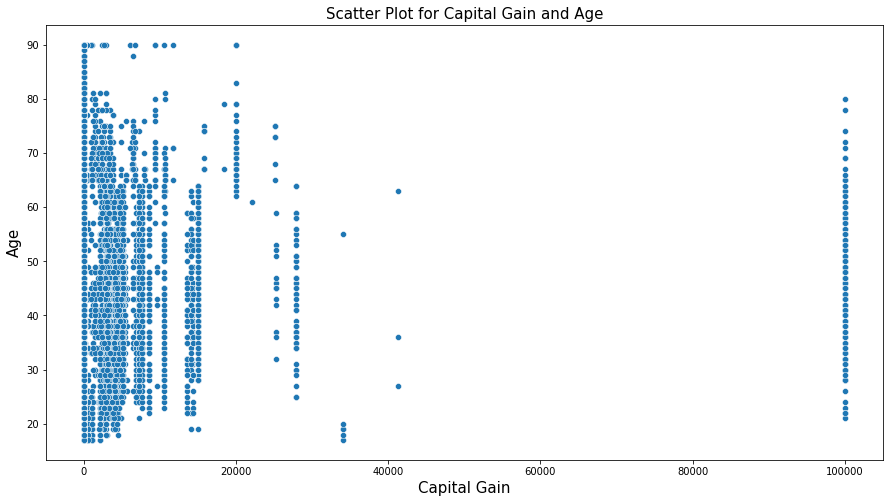

In [22]:
printmd('### Is there a negative relation between capital gain and age? ')
# set the figure size
plt.figure(figsize = (15,8))

# plot a sctter plot
sns.scatterplot(x = df['capital-gain'], y = df['age'])

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Scatter Plot for Capital Gain and Age', fontsize = 15)
plt.xlabel('Capital Gain', fontsize = 15)
plt.ylabel('Age', fontsize = 15)

# display the plot
plt.show()



No. From the above plot we see that there is no correlation between capital gain and age.


## Categorical and Quantitative Analysis

### Compare the average age with levels of income 

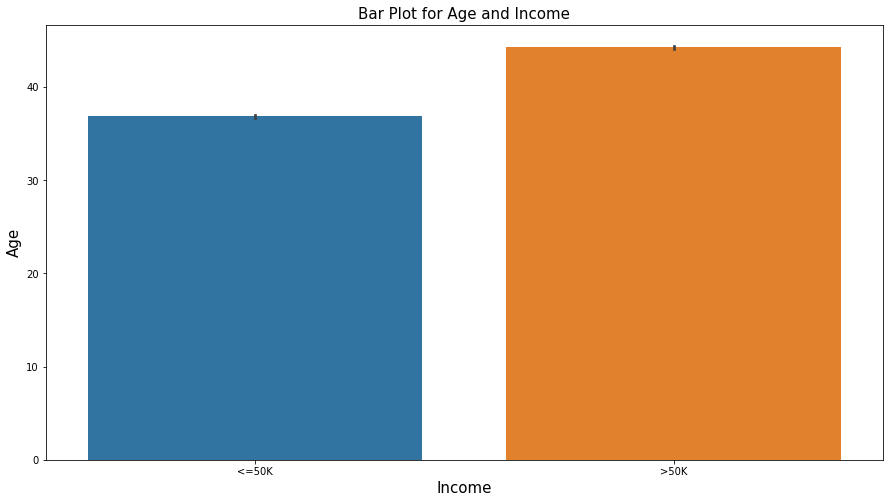

In [23]:
printmd('### Compare the average age with levels of income ')
# set the figure size
plt.figure(figsize = (15,8))

# plot a barplot with mean age on y-axis and income on x-axis
sns.barplot(x = 'income', y = 'age', data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Bar Plot for Age and Income', fontsize = 15)
plt.xlabel('Income', fontsize = 15)
plt.ylabel('Age', fontsize = 15)

# display the plot
plt.show()



The barplot shows that the income is greater than 50k for the individuals above 40 years; as, the people with higher age will have a high experience and more income.


### Check the distribution of working hours with respect to the gender of the individual

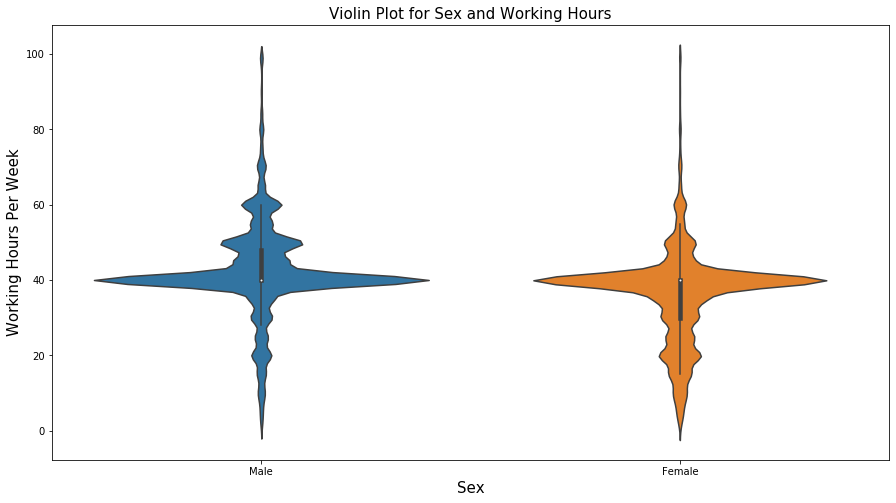

In [24]:
printmd('### Check the distribution of working hours with respect to the gender of the individual')
# set the figure size
plt.figure(figsize = (15,8))

# plot a violin plot
sns.violinplot(x = 'gender', y = 'hours-per-week', data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Violin Plot for Sex and Working Hours', fontsize = 15)
plt.xlabel('Sex', fontsize = 15)
plt.ylabel('Working Hours Per Week', fontsize = 15)

# display the plot
plt.show()

For large proportion of females the working hours are between 20 to 50 hours per week. Males have longer working hours (40 to 60 hours per week).

### Compare the income of individuals based on their education

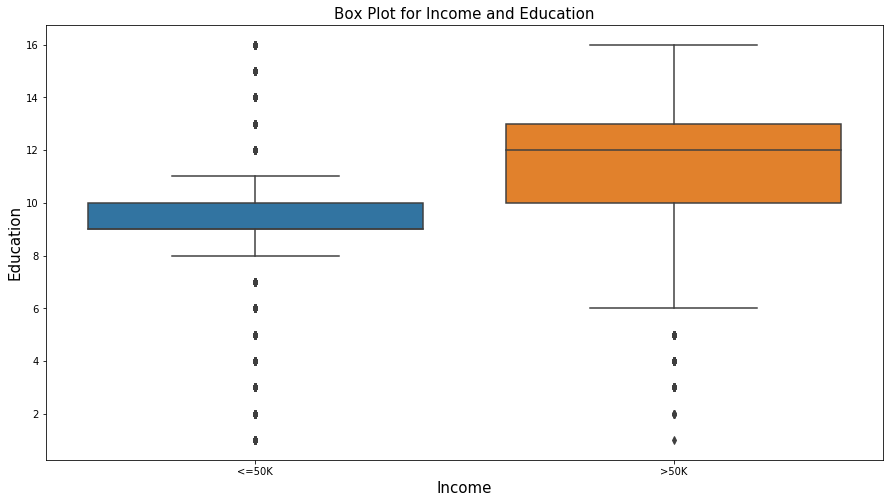

In [25]:
printmd('### Compare the income of individuals based on their education')
# set the figure size
plt.figure(figsize = (15,8))

# plot the boxplot
sns.boxplot(x = 'income', y = 'educational-num', data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Box Plot for Income and Education', fontsize = 15)
plt.xlabel('Income', fontsize = 15)
plt.ylabel('Education', fontsize = 15)

# display the plot
plt.show()

The salary is greater than 50k for the individuals with higher education. The outliers are present for both the categories of income.

### Find the average age of males and females

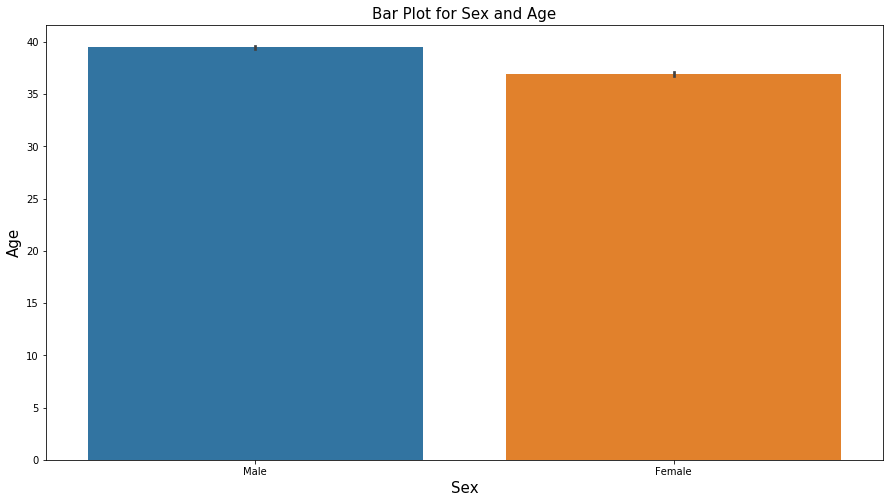

In [26]:
printmd('### Find the average age of males and females')
# set the figure size
plt.figure(figsize = (15,8))

# plot a barplot with mean age on y-axis and sex on x-axis
sns.barplot(x = 'gender', y = 'age', data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Bar Plot for Sex and Age', fontsize = 15)
plt.xlabel('Sex', fontsize = 15)
plt.ylabel('Age', fontsize = 15)

# display the plot
plt.show()



The average age of females in the dataset is approximately 36 years, and average age of males is approximately 39 years.


### Compare the distribution of working hours for the distinct classes of income 

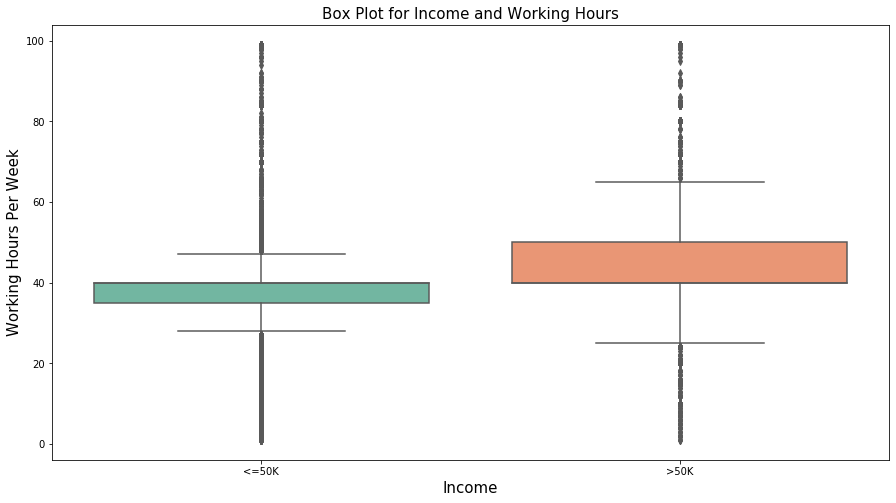

In [224]:
printmd('### Compare the distribution of working hours for the distinct classes of income ')
# set the figure size
plt.figure(figsize = (15,8))

# plot the boxplot
sns.boxplot(x = 'income', y = 'hours-per-week', data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Box Plot for Income and Working Hours', fontsize = 15)
plt.xlabel('Income', fontsize = 15)
plt.ylabel('Working Hours Per Week', fontsize = 15)

# display the plot
plt.show()



There is a difference between the working hours based on the income. Also, both the boxplots shows the presence of outliers.


###  Identify the positively skewed distributions of age based on the gender and race of the individual 

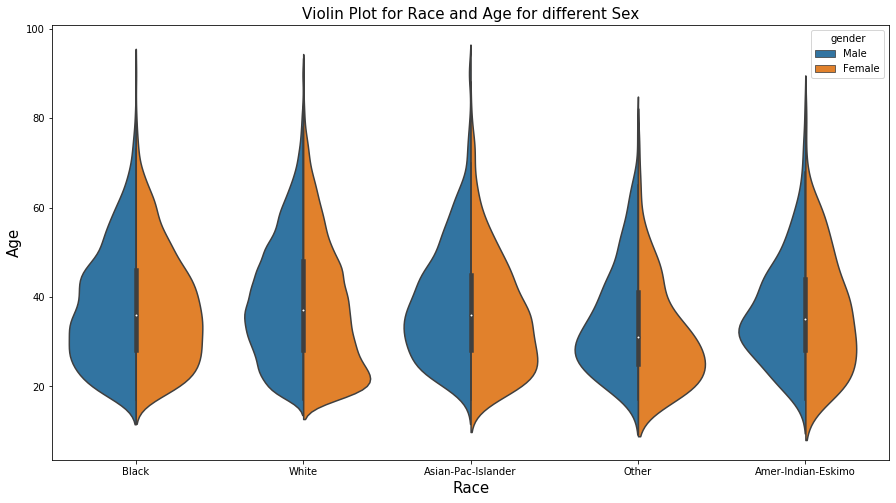

In [28]:
printmd('###  Identify the positively skewed distributions of age based on the gender and race of the individual ')
# set the figure size
plt.figure(figsize = (15,8))

# plot a violin plot
# 'split' returns a single violin plot with two categories
sns.violinplot(x = 'race', y = 'age', data = df, hue = 'gender', split = 'gender')

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Violin Plot for Race and Age for different Sex', fontsize = 15)
plt.xlabel('Race', fontsize = 15)
plt.ylabel('Age', fontsize = 15)

# display the plot
plt.show()

The above plot shows distribution for pairs:
    
       Distribution                     Race, Gender
        Positive             (White, Female), (Asian-Pac-Islander, Female), (Other, Male),(Black, Female),               Distribution                                   (Amer-India-Eskimo, Male)

### Compare the working hours for each working class

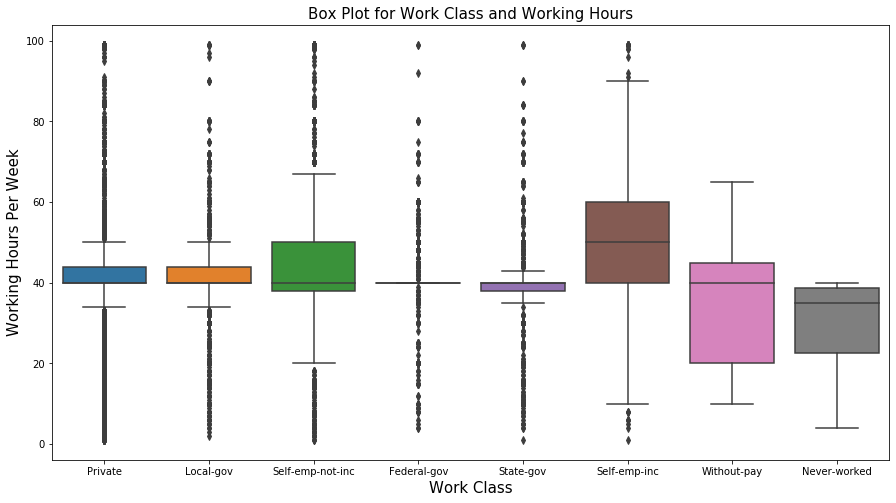

In [30]:
printmd('### Compare the working hours for each working class')
# set the figure size
plt.figure(figsize=(15,8))

# plot a boxplot
sns.boxplot(x = 'workclass', y = 'hours-per-week', data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Box Plot for Work Class and Working Hours', fontsize = 15)
plt.xlabel('Work Class', fontsize = 15)
plt.ylabel('Working Hours Per Week', fontsize = 15)

# display the plot
plt.show()

We can infer that high proportion of the federal-gov employees have nearly 40 working hours per week. But, there are some federal-gov employees with working hours other than 40. Also, the working hours for individuals varies greatly depending upon their professions.

 ### Compare the weightage based on demographic characteristics by gender 

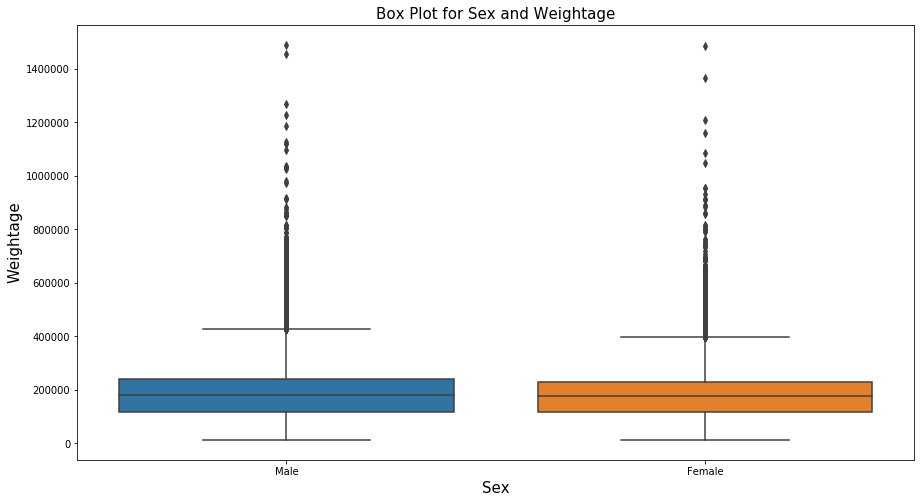

In [31]:
printmd(' ### Compare the weightage based on demographic characteristics by gender ')
# set the figure size
plt.figure(figsize = (15,8))

# plot a boxplot
sns.boxplot(x = 'gender', y = 'fnlwgt', data = df)

# add plot and axes labels
# set text size using 'fontsize'
plt.title('Box Plot for Sex and Weightage',fontsize = 15)
plt.xlabel('Sex', fontsize = 15)
plt.ylabel('Weightage', fontsize = 15)

# display the plot
plt.show()

Gender does not impact the weightage based on demographic characteristics variable (Violinplot can also be used for this comparison).

## Categorical and Categorical Analysis

In [32]:
printmd('### Study the variation in income by gender')
income_table = pd.crosstab(index = df["gender"], columns = df["income"]).apply(lambda r: r/(r.sum()), axis=1)

# display the crosstab
income_table

### Study the variation in income by gender

income,<=50K,>50K
gender,,
Female,0.890749,0.109251
Male,0.696233,0.303767


Approximately 20% of males have high income (above 50k) compared to females.

 ### Compare the income by race 

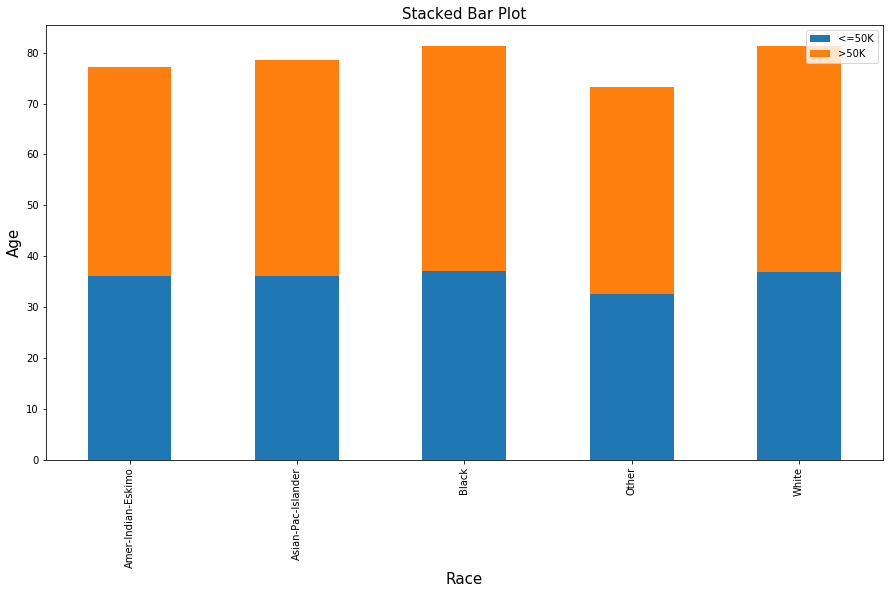

In [33]:
printmd(' ### Compare the income by race ')
# construct the pivot table to calculate average income 
stack = pd.pivot_table(df,index=["race"], columns=["income"], values='age', aggfunc='mean')

# plot the stacked bar graph
# 'stacked=True' returns the stacked bar plot
# set figure size using 'figsize'
fig = stack.plot.bar(stacked=True, figsize=(15,8))

# set axes labels
plt.title('Stacked Bar Plot', fontsize = 15)
fig.set_xlabel('Race', fontsize = 15)
fig.set_ylabel('Age', fontsize = 15)

# set the position of legend
fig.legend(loc='upper right')

# display the plot
plt.show()

Race has no impact over the income.

### Is there an all male profession according to the data?

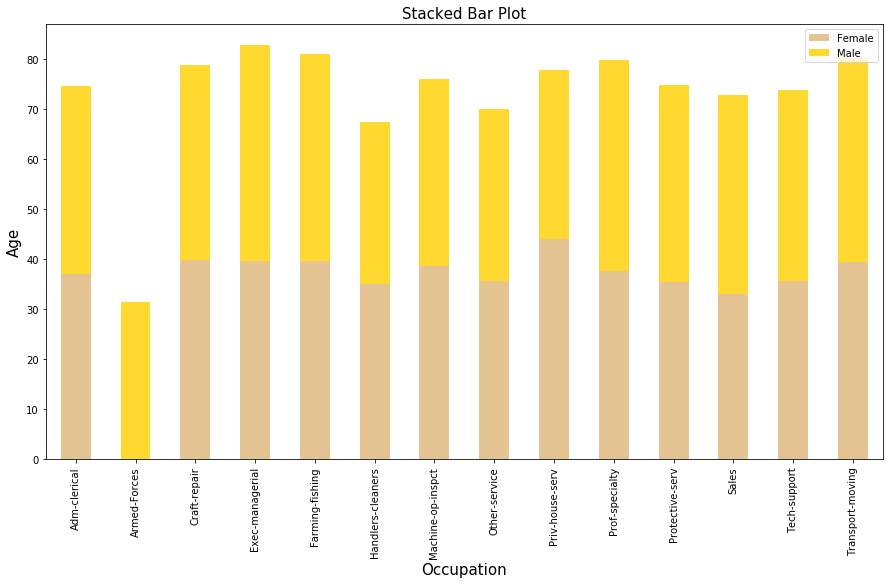

In [34]:
printmd('### Is there an all male profession according to the data?')
# construct the pivot table
stack = pd.pivot_table(df,index=["occupation"], columns=["gender"], values='age', aggfunc='mean')

# set the colors to the plot 
color = sns.set_palette('Set2_r')

# plot the stacked bar graph
# set the figure size using 'figsize'
# 'stacked=True' returns stacked bar plot
# set the colors using 'color' 
fig = stack.plot.bar(stacked=True, figsize=(15,8))

# set the axes and plot labels
plt.title('Stacked Bar Plot', fontsize = 15)
fig.set_xlabel('Occupation', fontsize = 15)
fig.set_ylabel('Age', fontsize = 15)

# set position of legend
fig.legend(loc='upper right')

# display the plot
plt.show()


According to the data Armed-forces have no females employed.

### How does income vary with working class? 

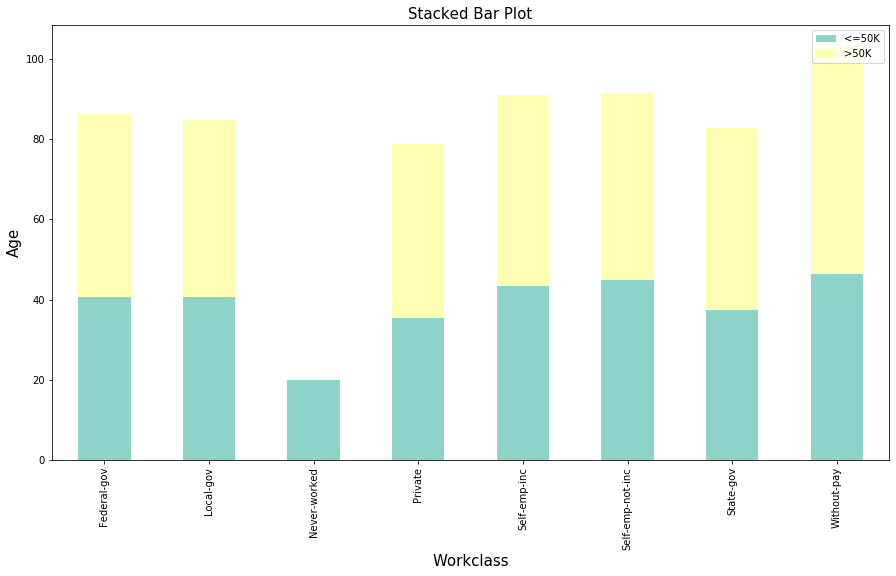

In [35]:
printmd('### How does income vary with working class? ')
# construct the pivot table
stack = pd.pivot_table(df,index=["workclass"], columns=["income"], values='age', aggfunc='mean')

# set the colors to the plot 
color = sns.set_palette('Set3')

# plot the stacked bar graph
fig=stack.plot.bar(stacked=True, figsize=(15,8))

# set the axes and plot labels
plt.title('Stacked Bar Plot', fontsize = 15)
fig.set_xlabel('Workclass', fontsize = 15)
fig.set_ylabel('Age', fontsize = 15)

# set position of legend
fig.legend(loc='upper right')

# display the plot
plt.show()

The two classes which include people who have never worked and people working without pay have all members with earnings less than 50k, hence they are represented with a single colour in the plot.

In [36]:
printmd('###  How is income related to marital status? ')
# construct the crosstab 
income_table=pd.crosstab(index=df["income"],columns=df["marital-status"])

# display the crosstab
income_table

###  How is income related to marital status? 

marital-status,Divorced,Married-AF-spouse,Married-civ-spouse,Married-spouse-absent,Never-married,Separated,Widowed
income,,,,,,,
<=50K,5962,23,12395,570,15384,1431,1390
>50K,671,14,9984,58,733,99,128


People who have never been married have large number of members who earn less than 50k, this makes sense as probably large proportion of people in this category are less aged.

### Compare the income for different occupations 

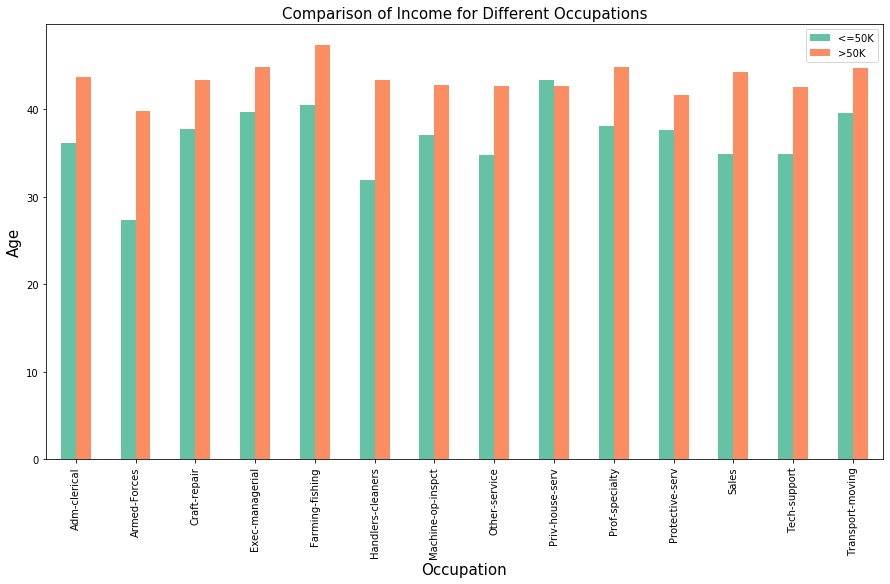

In [37]:
printmd('### Compare the income for different occupations ')
# construct the pivot table
count = pd.pivot_table(df,index=["occupation"], columns=["income"], values='age', aggfunc='mean')

# set the colors to the plot 
color = sns.set_palette('Set2')

# plot the side-by-side bar plot
# set the figure size using 'figsize'
fig = count.plot.bar(figsize=(15,8))

# set the axes and plot labels
plt.title('Comparison of Income for Different Occupations', fontsize = 15)
fig.set_xlabel('Occupation', fontsize = 15)
fig.set_ylabel('Age', fontsize = 15)

# set the position of legend
fig.legend(loc='upper right')

# display the plot
plt.show()


There is a significant difference in the income for individuals in armed forces. Also, the '?' indicates that the occupation is missing.

## Correlation

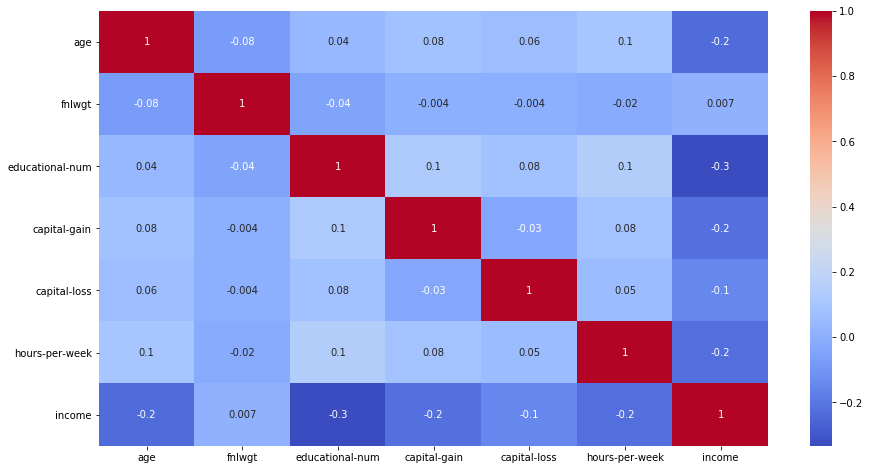

In [330]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(),annot=True, fmt = '.1g', cmap= 'coolwarm')
plt.show()

We can see that there is a strong correlation age and hours-of-week

## Analyze the Numerical Variables

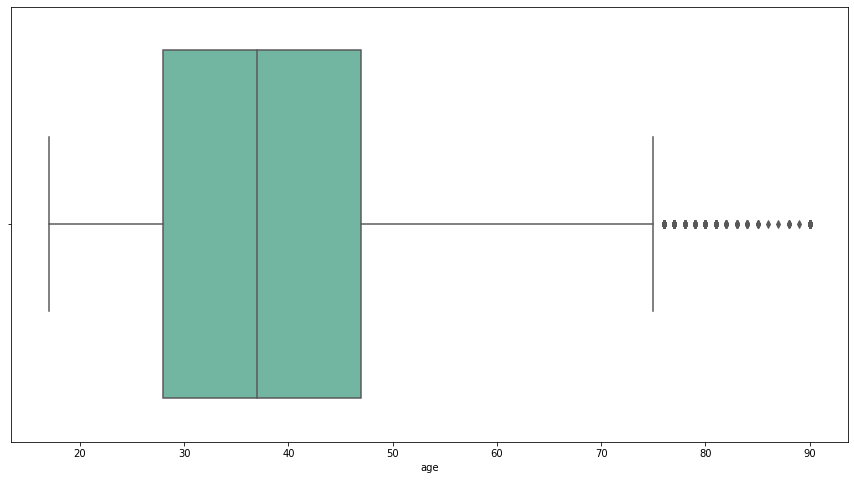

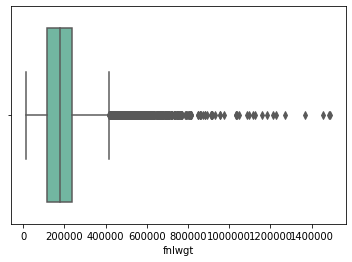

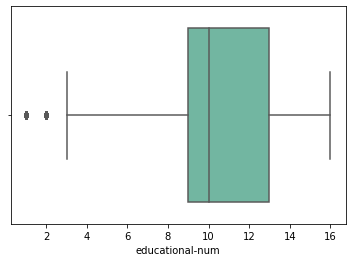

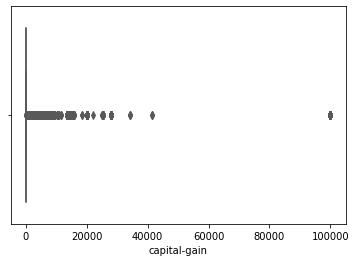

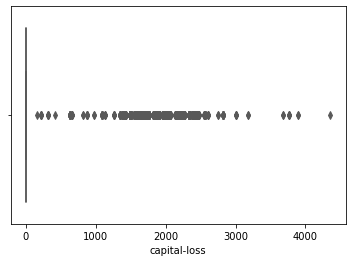

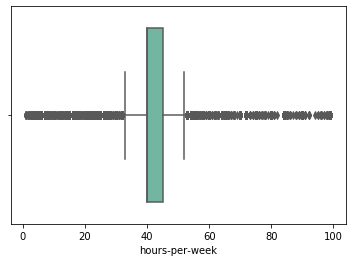

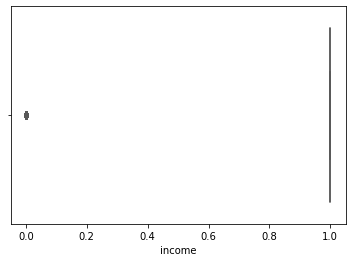

In [331]:
df_num = df.select_dtypes(include=np.number)
plt.figure(figsize=(15, 8))
for i in df_num:
    sns.boxplot(df[i])
    plt.show()

## Handling Outliers 

In [270]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

age                    20.0
fnlwgt             120091.5
educational-num         3.0
capital-gain            0.0
capital-loss            0.0
hours-per-week          5.0
dtype: float64


In [271]:
df  = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis = 1)]

Using the IQR method, we have handled the outliers in the dataset. 

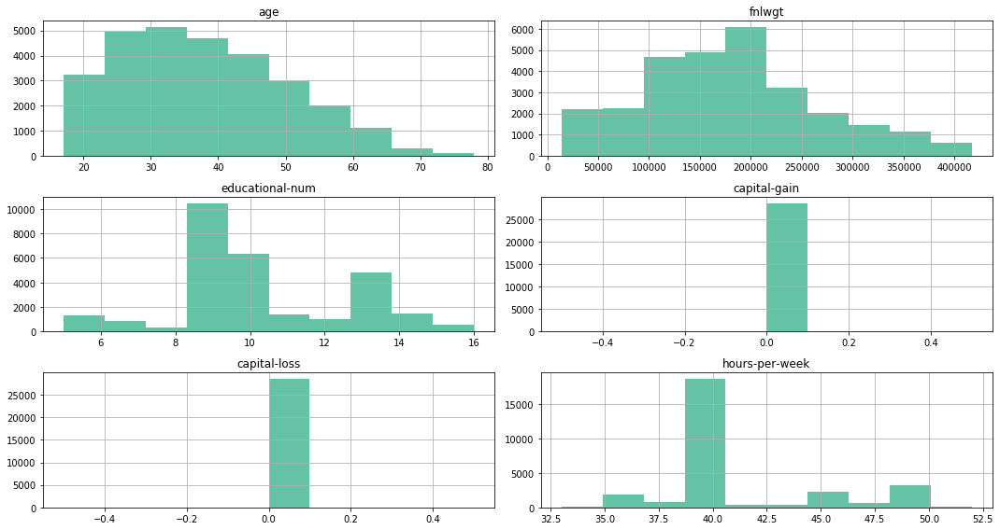

Skewness:


age                0.443945
fnlwgt             0.414972
educational-num    0.263975
capital-gain       0.000000
capital-loss       0.000000
hours-per-week     1.063842
dtype: float64

In [272]:
plt.rcParams['figure.figsize'] = [15,8]
df.drop('income', axis = 1).hist()
plt.tight_layout()
plt.show()  
print('Skewness:')
df.drop('income', axis = 1).skew()

## Feature Engineering 

### Scaling the Data

In [342]:
df_num = df.select_dtypes(exclude='object')

In [344]:
y_last = df_num['income']
x = df_num.drop(columns='income')
column_names = x.columns.values
type(x)

pandas.core.frame.DataFrame

In [345]:
from sklearn import preprocessing
scaler = preprocessing.StandardScaler()
x_stndrd = scaler.fit_transform(x)
type(x_stndrd)

numpy.ndarray

In [346]:
x_stndrd = pd.DataFrame(x_stndrd)
x_stndrd.columns = column_names
type(x_stndrd)

pandas.core.frame.DataFrame

### Encoding the categorical variable

In [347]:
df_cat=df.select_dtypes(exclude=np.number)

In [348]:
df_cat.head()

,workclass,education,marital-status,occupation,relationship,race,gender,native-country
0,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,United-States
1,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,United-States
2,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,United-States
3,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,United-States
4,Private,10th,Never-married,Other-service,Not-in-family,White,Male,United-States


In [350]:
X_encode=pd.get_dummies(df_cat,columns=df_cat.columns)
X_encode.head()

,workclass_Federal-gov,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,workclass_Self-emp-not-inc,workclass_State-gov,workclass_Without-pay,education_10th,education_11th,education_12th,...,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia
0,0,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [351]:
X_encode.shape

(45222, 98)

In [352]:
x = pd.concat([x_stndrd,X_encode],axis=1)

In [353]:
x.shape

(45222, 104)

In [354]:
x.head()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week,workclass_Federal-gov,workclass_Local-gov,workclass_Private,workclass_Self-emp-inc,...,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia
0,-1.024983,0.350889,-1.221559,-0.146733,-0.21878,-0.078120,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
1,-0.041455,-0.945878,-0.438122,-0.146733,-0.21878,0.754701,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
2,-0.798015,1.393592,0.737034,-0.146733,-0.21878,-0.078120,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0.412481,-0.278420,-0.046403,0.877467,-0.21878,-0.078120,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
4,-0.344079,0.084802,-1.613277,-0.146733,-0.21878,-0.910942,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


In [355]:
x.isnull().values.any()

False

In [356]:
x.isnull().sum().sum()

0

### Target Variable

In [357]:
df['income'].value_counts()

1    34014
0    11208
Name: income, dtype: int64

In [360]:
y_last.value_counts()

1    34014
0    11208
Name: income, dtype: int64

## Train Test Split

In [361]:
X_train, X_test, y_train, y_test = train_test_split(x, y_last, test_size =   0.3, random_state = 10) 

In [404]:
score_card = pd.DataFrame(columns=["Model Name","Stability","r2_score", 'AUC', 'Precision', 'Recall',
                                       'Accuracy', 'Kappa', 'f1-score'])
def update_score_card(Model_name,model,cutoff='-',stability="Stable"):
    y_pred_prob = model.predict(X_test)
    y_pred = [ 0 if x < cutoff else 1 for x in y_pred_prob]
    global score_card
    score_card = score_card.append({"Model Name":Model_name,
                                    'Stability': stability,
                                    "r2_score":model.prsquared,
                                    'AUC' : metrics.roc_auc_score(y_test, y_pred_prob),
                                    'Precision': metrics.precision_score(y_test, y_pred),
                                    'Recall': metrics.recall_score(y_test, y_pred),
                                    'Accuracy': metrics.accuracy_score(y_test, y_pred),
                                    'Kappa':metrics.cohen_kappa_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred)}, 
                                    ignore_index = True)
    return score_card

In [405]:
def get_test_report(model):
    test_pred = model.predict(X_test)
    return(classification_report(y_test, test_pred))

In [406]:
def plot_roc(model):
    y_pred_prob = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.plot(fpr, tpr)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.plot([0, 1], [0, 1],'r--')
    plt.title('ROC curve for Adult Income Analysis', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
    plt.text(x = 0.02, y = 0.9, s = ('AUC Score:',round(roc_auc_score(y_test, y_pred_prob),4)))
    plt.grid(True)

In [407]:
def plot_confusion_matrix(model):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.show()

## Guassian naive bayes model

In [408]:
def update_score_card(Model_name,model,cutoff="-",stability="Stable"):
    y_pred_prob = model.predict_proba(X_test)[:,1]
    y_pred=model.predict(X_test)
    global score_card
    score_card = score_card.append({"Model Name":Model_name,
                                    'Stability': stability,
                                    "r2_score":metrics.r2_score(y_test, y_pred),
                                    'AUC' : metrics.roc_auc_score(y_test, y_pred_prob),
                                    'Precision': metrics.precision_score(y_test, y_pred),
                                    'Recall': metrics.recall_score(y_test, y_pred),
                                    'Accuracy': metrics.accuracy_score(y_test, y_pred),
                                    'Kappa':metrics.cohen_kappa_score(y_test, y_pred),
                                    'f1-score': metrics.f1_score(y_test, y_pred)}, 
                                    ignore_index = True)
    return score_card

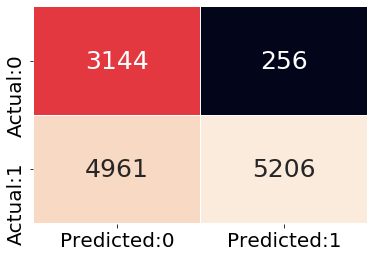

In [409]:
gnb = GaussianNB()
gnb_model = gnb.fit(X_train, y_train)
plot_confusion_matrix(gnb_model)

In [410]:
test_report = get_test_report(gnb_model)
print(test_report)

              precision    recall  f1-score   support

           0       0.39      0.92      0.55      3400
           1       0.95      0.51      0.67     10167

    accuracy                           0.62     13567
   macro avg       0.67      0.72      0.61     13567
weighted avg       0.81      0.62      0.64     13567



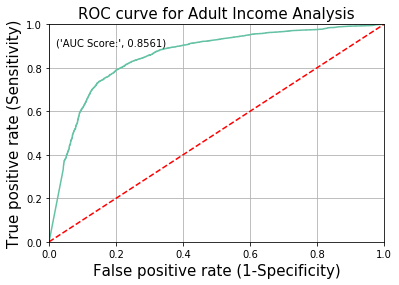

In [411]:
plot_roc(gnb_model)

In [412]:
update_score_card("gNB Classifier",gnb_model,stability="Moderate")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197


## KNN model

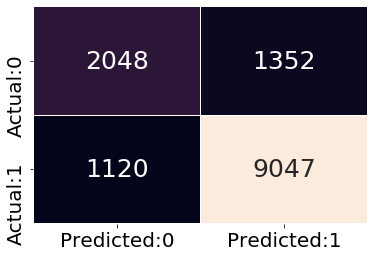

In [416]:
knn_classification = KNeighborsClassifier(n_neighbors = 3)
knn_model = knn_classification.fit(X_train, y_train)
plot_confusion_matrix(knn_model)

In [417]:
test_report = get_test_report(knn_model)
print(test_report)

              precision    recall  f1-score   support

           0       0.65      0.60      0.62      3400
           1       0.87      0.89      0.88     10167

    accuracy                           0.82     13567
   macro avg       0.76      0.75      0.75     13567
weighted avg       0.81      0.82      0.82     13567



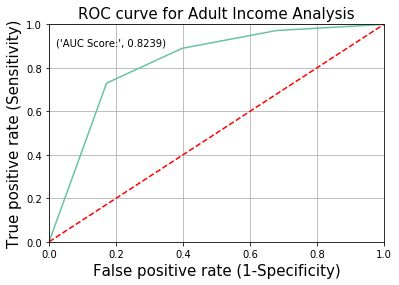

In [418]:
plot_roc(knn_model)

In [419]:
update_score_card("KNN Classifier",knn_model,stability="Moderate")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197
1,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
2,KNN Classifier,Moderate,0.029802,0.823872,0.869987,0.889840,0.817793,0.503629,0.879802


## DECISION TREE

In [420]:
decision_tree_classification =DecisionTreeClassifier(criterion = 'entropy', random_state = 10)
decision_tree = decision_tree_classification.fit(X_train, y_train)

In [389]:
labels = X_train.columns
dot_data = tree.export_graphviz(decision_tree, feature_names = labels, class_names = ["0","1"], filled = True) 
graph = pydotplus.graph_from_dot_data(dot_data) 
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.279137 to fit



In [421]:
test_report = get_test_report(decision_tree)
print(test_report)

              precision    recall  f1-score   support

           0       0.63      0.63      0.63      3400
           1       0.88      0.88      0.88     10167

    accuracy                           0.81     13567
   macro avg       0.75      0.75      0.75     13567
weighted avg       0.81      0.81      0.81     13567



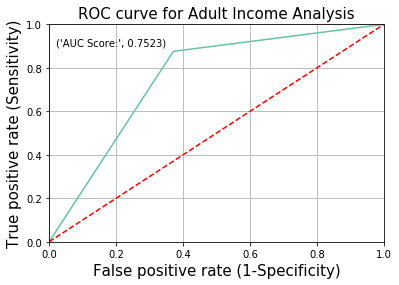

In [422]:
plot_roc(decision_tree)

In [423]:
update_score_card("Decision Tree Classifier",decision_tree,stability="Good")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197
1,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
2,KNN Classifier,Moderate,0.029802,0.823872,0.869987,0.889840,0.817793,0.503629,0.879802
3,Decision Tree Classifier,Good,0.008215,0.752293,0.875836,0.875578,0.813739,0.504253,0.875707


## Random Forest

In [424]:
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 10)
rf_model = rf_classification.fit(X_train, y_train)

In [425]:
test_report = get_test_report(rf_model)
print(test_report) 

              precision    recall  f1-score   support

           0       0.68      0.67      0.67      3400
           1       0.89      0.89      0.89     10167

    accuracy                           0.84     13567
   macro avg       0.78      0.78      0.78     13567
weighted avg       0.84      0.84      0.84     13567



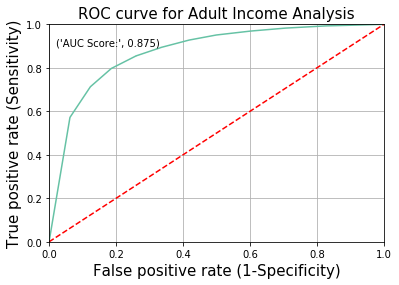

In [426]:
plot_roc(rf_classification)

In [427]:
update_score_card("Random Forest Classifier",rf_model,stability="Good")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197
1,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
2,KNN Classifier,Moderate,0.029802,0.823872,0.869987,0.889840,0.817793,0.503629,0.879802
3,Decision Tree Classifier,Good,0.008215,0.752293,0.875836,0.875578,0.813739,0.504253,0.875707
4,Random Forest Classifier,Good,0.130275,0.875045,0.888726,0.893971,0.836662,0.562569,0.891341


# BOOSTING TECHNIQUES

## ADABoost

In [428]:
ada_model = AdaBoostClassifier(n_estimators = 40, random_state = 10)
ada_model.fit(X_train, y_train)

AdaBoostClassifier(n_estimators=40, random_state=10)

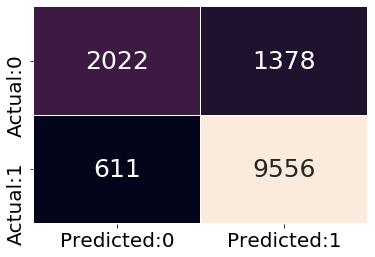

In [429]:
plot_confusion_matrix(ada_model)

In [430]:
test_report = get_test_report(ada_model)
print(test_report) 

              precision    recall  f1-score   support

           0       0.77      0.59      0.67      3400
           1       0.87      0.94      0.91     10167

    accuracy                           0.85     13567
   macro avg       0.82      0.77      0.79     13567
weighted avg       0.85      0.85      0.85     13567



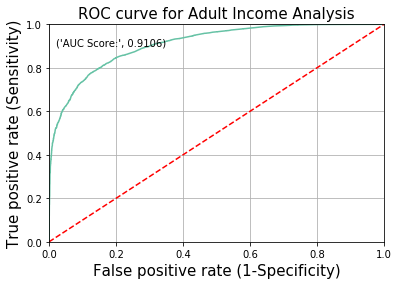

In [431]:
plot_roc(ada_model)

In [432]:
update_score_card("ADAboost classifier",ada_model,stability="Moderate")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197
1,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
2,KNN Classifier,Moderate,0.029802,0.823872,0.869987,0.889840,0.817793,0.503629,0.879802
3,Decision Tree Classifier,Good,0.008215,0.752293,0.875836,0.875578,0.813739,0.504253,0.875707
4,Random Forest Classifier,Good,0.130275,0.875045,0.888726,0.893971,0.836662,0.562569,0.891341
5,ADAboost classifier,Moderate,0.219367,0.910574,0.873971,0.939904,0.853394,0.578002,0.905739


## Gradient Boost

In [433]:
gboost_model = GradientBoostingClassifier(n_estimators = 150, max_depth = 10, random_state = 10)
gboost_model.fit(X_train, y_train)

GradientBoostingClassifier(max_depth=10, n_estimators=150, random_state=10)

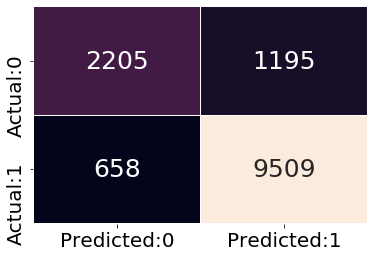

In [434]:
plot_confusion_matrix(gboost_model)

In [435]:
test_report = get_test_report(gboost_model)
print(test_report) 

              precision    recall  f1-score   support

           0       0.77      0.65      0.70      3400
           1       0.89      0.94      0.91     10167

    accuracy                           0.86     13567
   macro avg       0.83      0.79      0.81     13567
weighted avg       0.86      0.86      0.86     13567



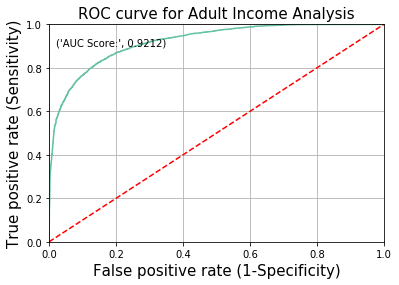

In [436]:
plot_roc(gboost_model)

In [437]:
update_score_card("Gradient boost classifier",gboost_model,stability="Moderate")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197
1,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
2,KNN Classifier,Moderate,0.029802,0.823872,0.869987,0.889840,0.817793,0.503629,0.879802
3,Decision Tree Classifier,Good,0.008215,0.752293,0.875836,0.875578,0.813739,0.504253,0.875707
4,Random Forest Classifier,Good,0.130275,0.875045,0.888726,0.893971,0.836662,0.562569,0.891341
5,ADAboost classifier,Moderate,0.219367,0.910574,0.873971,0.939904,0.853394,0.578002,0.905739
6,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217


# XG Boost

In [438]:
xgb_model = XGBClassifier(max_depth = 10, gamma = 1)
xgb_model.fit(X_train, y_train)

[18:52:50] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

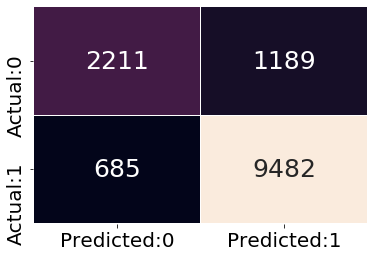

In [439]:
plot_confusion_matrix(xgb_model)

In [440]:
test_report = get_test_report(xgb_model)
print(test_report) 

              precision    recall  f1-score   support

           0       0.76      0.65      0.70      3400
           1       0.89      0.93      0.91     10167

    accuracy                           0.86     13567
   macro avg       0.83      0.79      0.81     13567
weighted avg       0.86      0.86      0.86     13567



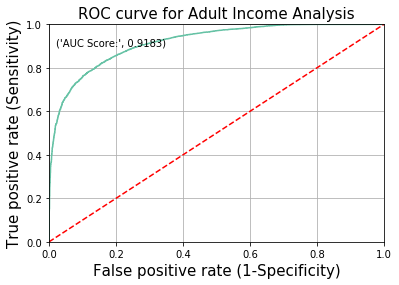

In [441]:
plot_roc(xgb_model)

In [442]:
update_score_card("XGBClassifier",xgb_model,stability="Moderate")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197
1,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
2,KNN Classifier,Moderate,0.029802,0.823872,0.869987,0.889840,0.817793,0.503629,0.879802
3,Decision Tree Classifier,Good,0.008215,0.752293,0.875836,0.875578,0.813739,0.504253,0.875707
4,Random Forest Classifier,Good,0.130275,0.875045,0.888726,0.893971,0.836662,0.562569,0.891341
5,ADAboost classifier,Moderate,0.219367,0.910574,0.873971,0.939904,0.853394,0.578002,0.905739
6,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
7,XGBClassifier,Moderate,0.264502,0.918308,0.888577,0.932625,0.861871,0.613168,0.910068


## Stacking Classifier

In [443]:
base_learners = [('rf_model', RandomForestClassifier(criterion = 'entropy', max_depth = 10, max_features = 'sqrt', 
                                                     max_leaf_nodes = 8, min_samples_leaf = 5, min_samples_split = 2, 
                                                     n_estimators = 50, random_state = 10)),
                 ('KNN_model', KNeighborsClassifier(n_neighbors = 17, metric = 'euclidean')),
                 ('NB_model', GaussianNB())]
stack_model = StackingClassifier(estimators = base_learners, final_estimator = GaussianNB())
stack_model.fit(X_train, y_train)

StackingClassifier(estimators=[('rf_model',
                                RandomForestClassifier(criterion='entropy',
                                                       max_depth=10,
                                                       max_features='sqrt',
                                                       max_leaf_nodes=8,
                                                       min_samples_leaf=5,
                                                       n_estimators=50,
                                                       random_state=10)),
                               ('KNN_model',
                                KNeighborsClassifier(metric='euclidean',
                                                     n_neighbors=17)),
                               ('NB_model', GaussianNB())],
                   final_estimator=GaussianNB())

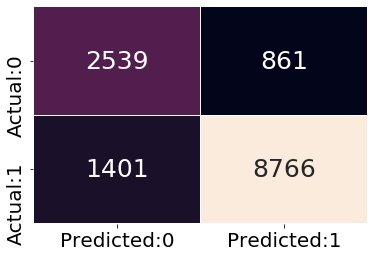

In [444]:
plot_confusion_matrix(stack_model)

In [445]:
test_report = get_test_report(stack_model)
print(test_report)

              precision    recall  f1-score   support

           0       0.64      0.75      0.69      3400
           1       0.91      0.86      0.89     10167

    accuracy                           0.83     13567
   macro avg       0.78      0.80      0.79     13567
weighted avg       0.84      0.83      0.84     13567



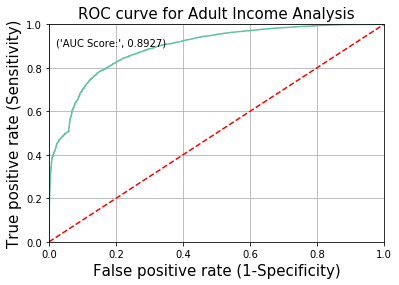

In [446]:
plot_roc(stack_model)

In [447]:
update_score_card("Stacking classifier",stack_model,stability="Moderate")

,Model Name,Stability,r2_score,AUC,Precision,Recall,Accuracy,Kappa,f1-score
0,gNB Classifier,Moderate,-1.047542,0.856091,0.953131,0.512049,0.615464,0.299039,0.666197
1,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
2,KNN Classifier,Moderate,0.029802,0.823872,0.869987,0.889840,0.817793,0.503629,0.879802
3,Decision Tree Classifier,Good,0.008215,0.752293,0.875836,0.875578,0.813739,0.504253,0.875707
4,Random Forest Classifier,Good,0.130275,0.875045,0.888726,0.893971,0.836662,0.562569,0.891341
5,ADAboost classifier,Moderate,0.219367,0.910574,0.873971,0.939904,0.853394,0.578002,0.905739
6,Gradient boost classifier,Moderate,0.272744,0.921227,0.888359,0.935281,0.863419,0.616199,0.911217
7,XGBClassifier,Moderate,0.264502,0.918308,0.888577,0.932625,0.861871,0.613168,0.910068
8,Stacking classifier,Moderate,0.112221,0.892654,0.910564,0.862201,0.833272,0.578395,0.885723


# The best performing model is Gradient boost classifier with the acurracy score 0.921227